In [2]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier as KNN
from sklearn.metrics import accuracy_score

#from mlxtend.preprocessing import MeanCenterer


# Loading the datasets

In [3]:
#Data load
test_data_filepath = 'fashion_test.npy'
train_data_filepath = 'fashion_train.npy'
fashion_train = np.load(train_data_filepath)
fashion_test = np.load(test_data_filepath)
fashion_train

FileNotFoundError: [Errno 2] No such file or directory: 'fashion_train.npy'

# Exploring an individual data point/image/clothing piece

In [1]:
#Class definitions
def tell_class(x):
    class_here = 'Error'
    if x == 0:
        class_here = 'T-shirt/top'
    elif x == 1:
        class_here = 'Trouser'
    elif x == 2:
        class_here = 'Pullover'
    elif x == 3:
        class_here = 'Dress'
    elif x == 4:
        class_here = 'Shirt'

    print(f"The class of this image is {class_here}")


In [6]:
#Choose one of the data points
image_choice = 500 #Change the value here to pick any of the 10,000 arrays/images

#Choose an image
example_array = fashion_train[image_choice] #Change the value 1 here to pick any of the 10,000 arrays/images
class_of_example = tell_class(example_array[-1]) #pick out the integer from the array that indicates the category of clothing
example_array_just_image = example_array[:-1] #remove the last value in the array, since its the class of the image

The class of this image is Dress


In [7]:
#Display the chosen image
square_array = np.reshape(example_array_just_image, (28,28)) #reshape the array from a single column of values to a square image
image = Image.fromarray(square_array, 'L') #convert
image.show() #display

# Whatever is next

In [8]:
all_of_the_classes = []

for array in fashion_train:
    all_of_the_classes.append(array[-1]) #takes the classification value off the end of each datapoint


In [9]:

total_class_count = sum(all_of_the_classes) #Feel free to ignore this cell, i was doing this for me

print('Expected value if they were equally represented is 2')

EX = total_class_count/10000

print(f'Actual expected value of these results is {EX}') #This is a fucking weird way to do this, but this is just for my intuition



Expected value if they were equally represented is 2
Actual expected value of these results is 2.002


This difference indicates a slight skew to higher class number

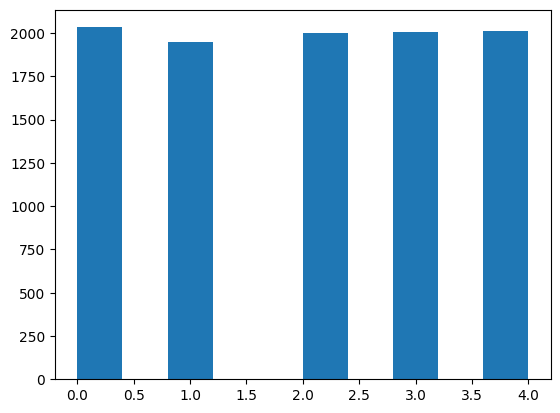

In [10]:
plt.hist(all_of_the_classes)
plt.show()

In the above histogram we can see that there's minimal difference in the counts of each classes representation in the training dataset

A common exploratory data analysis method for images is looking at the changes in image size, this is irrelevant here since it is pre-determined that all the images are 28x28

In [11]:
all_of_the_images = []

for array in fashion_train:
    all_of_the_images.append(array[:-1]) #similarly to before, takes just the image data from each data point

all_of_the_images

[array([  0,   0,   0,   0,   0,   3,   0,   0,   0,  41,  92, 172, 100,
         23,  22,  33, 104, 136,  93,  44,   0,   0,   0,   2,   0,   0,
          0,   0,   0,   0,   0,   0,   2,   0,   6, 119, 166, 177, 159,
        153, 227, 232, 215, 240, 227, 156, 162, 180, 175, 102,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   2,   0,  16, 166, 143, 133,
        126, 134, 121, 102, 146, 171, 160, 106, 113, 130, 130, 136, 151,
        159,   0,   0,   1,   0,   0,   0,   0,   0,   1,   0, 105, 139,
        123, 130, 129, 133, 133, 134, 116, 108, 113, 129, 135, 136, 131,
        128, 126, 150,  77,   0,   2,   0,   0,   0,   0,   0,   0,   2,
        151, 128, 126, 129, 130, 131, 130, 129, 131, 135, 134, 130, 130,
        131, 130, 130, 130, 139, 138,   0,   0,   0,   0,   0,   0,   0,
          0,  44, 148, 129, 126, 130, 133, 129, 129, 130, 130, 129, 129,
        130, 129, 131, 130, 131, 125, 146, 165,   2,   0,   0,   0,   0,
          0,   0,   0,  93, 156, 148, 124, 126, 126

In [12]:
sums_of_grayscales = []

for array in all_of_the_images:
    sums_of_grayscales.append(sum(array))

sums_of_grayscales #aka make a feature outta nothing

[60589,
 27554,
 71253,
 41132,
 58999,
 28883,
 58935,
 80676,
 30774,
 29029,
 62865,
 56398,
 38301,
 26891,
 57314,
 52992,
 29930,
 104121,
 69792,
 52522,
 50687,
 72872,
 28216,
 45659,
 77367,
 87618,
 38928,
 31377,
 89168,
 60089,
 72130,
 41643,
 40273,
 64629,
 74192,
 64997,
 33563,
 22388,
 67422,
 35139,
 65651,
 67407,
 38386,
 54285,
 75674,
 43528,
 90955,
 101308,
 43022,
 31590,
 57494,
 59745,
 33043,
 68225,
 66573,
 38261,
 72663,
 81548,
 53785,
 88795,
 42435,
 45075,
 54628,
 45032,
 68296,
 88723,
 30632,
 92779,
 67301,
 91277,
 78519,
 68691,
 90357,
 57071,
 32235,
 36360,
 24214,
 53637,
 45403,
 41530,
 12865,
 72694,
 26611,
 64177,
 39782,
 65430,
 50658,
 44935,
 103081,
 71011,
 78044,
 33870,
 56855,
 36853,
 47317,
 82574,
 60363,
 34322,
 38001,
 32791,
 18863,
 42502,
 100038,
 25137,
 68332,
 66490,
 78343,
 32148,
 29722,
 49115,
 61523,
 44998,
 59809,
 43662,
 86895,
 43337,
 16107,
 43536,
 40153,
 63081,
 87595,
 59122,
 88184,
 49807,
 466

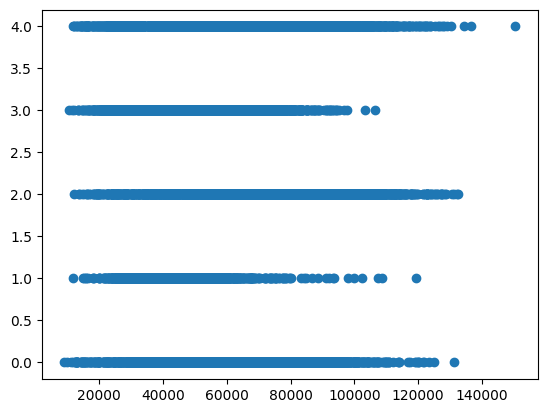

In [13]:
plt.scatter(sums_of_grayscales, all_of_the_classes)
plt.show()

# Prior to performing the PCA we want to seperate the training data into training and validation

In [14]:
X_train, X_validate, y_train, y_validate = train_test_split(all_of_the_images, all_of_the_classes, test_size = 0.2, random_state = 43, stratify = all_of_the_classes) #I'm hoping that the stratify parameter keeps the balance of classes in the two splits

a=len(X_train)
b=len(X_validate)

print(f'Train size {a} Validate size {b}')

Train size 8000 Validate size 2000


mlxtend

In [15]:
cov_mat = np.cov(X_train) # denoted as S in slides
eigen_vals, eigen_vecs = np.linalg.eig(cov_mat)


In [16]:

# Eigenvalues in decresing order
order = np.argsort(eigen_vals)[::-1]


In [17]:

sort_eigen_vals = eigen_vals[order]
sort_eigen_vecs = eigen_vecs[:, order]


In [19]:
X_train

[array([  0,   0,   0,   0,   0,   0,   0,  59, 197, 220,  94,  39,   4,
          0,   0,   0,   0,  16, 147, 154,  36,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0, 110, 240, 231, 217, 220, 255,
        255, 255, 239, 229, 255, 255, 245, 241, 223, 225, 234, 175,   0,
          0,   0,   0,   0,   0,   0,   0,   0,  65, 247, 222, 213, 215,
        200, 200, 224, 228, 232, 226, 238, 229, 217, 206, 209, 208, 217,
        240, 179,   0,   0,   0,   0,   0,   0,   0,   0, 176, 235, 214,
        217, 213, 214, 210, 204, 201, 200, 207, 207, 196, 210, 213, 211,
        213, 209, 208, 236,  62,   0,   0,   0,   0,   0,   0,   0, 222,
        234, 217, 217, 218, 215, 212, 214, 216, 219, 203, 207, 210, 212,
        210, 210, 211, 214, 214, 236, 142,   0,   0,   0,   0,   0,   0,
          0, 239, 230, 221, 219, 216, 213, 210, 211, 215, 158, 192, 247,
        211, 209, 211, 208, 214, 211, 216, 230, 206,   0,   0,   0,   0,
          0,   0,   3, 255, 226, 222, 215, 214, 214

In [18]:

for i in range(X_train.shape[1]):
    print('Eigenvalue {}: {:.4f}'.format(i+1, sort_eigen_vals[i]))
    print(f'PC {i+1} loading vector {sort_eigen_vecs[:,i]}')


AttributeError: 'list' object has no attribute 'shape'

In [ ]:

# Print the percentage of variance explained by each component
explained_variance_ratio = sort_eigen_vals / np.sum(sort_eigen_vals)
print("\nPercentage of variance explained by each component:")
for i, var_ratio in enumerate(explained_variance_ratio):
    print(f'PC {i+1}: {var_ratio * 100:.2f}%')